# Libraries

In [1]:
import scipy.io as sio
import sys

import pandas as pd
import numpy as np

import statsmodels.tsa.stattools as tsa
from statsmodels.tsa.api import VAR

sys.path.insert(0, '../../Libraries')
import JacksonsTSPackage as jts

# Data

In [2]:
sst = sio.loadmat('data/sst.mat')
sst

{'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sat Dec 14 14:14:49 2013',
 '__version__': '1.0',
 '__globals__': [],
 'X': array([[array([[28.15, 28.27, 28.05, 28.39, 28.67, 29.26],
        [28.43, 28.81, 27.88, 28.09, 27.12, 26.99],
        [28.12, 27.69, 28.03, 26.9 , 25.84, 24.95],
        [28.56, 28.36, 28.44, 28.35, 27.3 , 25.71],
        [29.29, 29.73, 29.18, 28.41, 27.63, 27.01]])],
        [array([[28.16, 28.27, 28.06, 28.53, 28.68, 29.44],
        [28.43, 28.81, 27.89, 28.09, 27.19, 27.12],
        [28.11, 27.7 , 28.  , 26.93, 26.02, 25.07],
        [28.56, 28.34, 28.45, 28.47, 27.41, 25.83],
        [29.31, 29.76, 29.18, 28.55, 27.63, 27.01]])],
        [array([[28.19, 28.3 , 28.09, 28.65, 28.68, 29.66],
        [28.44, 28.81, 27.93, 28.09, 27.42, 27.33],
        [28.13, 27.74, 28.05, 27.03, 26.17, 25.14],
        [28.57, 28.33, 28.52, 28.6 , 27.55, 25.98],
        [29.34, 29.83, 29.22, 28.74, 27.63, 27.01]])],
        ...,
        [array([[29.58, 29.12,

In [3]:
tensor_shape = (len(sst['X']), sst['X'][0][0].shape[0], sst['X'][0][0].shape[1])
tensor_shape

(2000, 5, 6)

In [4]:
tensor_data = np.zeros(tensor_shape)
for i in range(tensor_shape[0]):
    tensor_data[i] = sst['X'][i][0]
tensor_data

array([[[28.15, 28.27, 28.05, 28.39, 28.67, 29.26],
        [28.43, 28.81, 27.88, 28.09, 27.12, 26.99],
        [28.12, 27.69, 28.03, 26.9 , 25.84, 24.95],
        [28.56, 28.36, 28.44, 28.35, 27.3 , 25.71],
        [29.29, 29.73, 29.18, 28.41, 27.63, 27.01]],

       [[28.16, 28.27, 28.06, 28.53, 28.68, 29.44],
        [28.43, 28.81, 27.89, 28.09, 27.19, 27.12],
        [28.11, 27.7 , 28.  , 26.93, 26.02, 25.07],
        [28.56, 28.34, 28.45, 28.47, 27.41, 25.83],
        [29.31, 29.76, 29.18, 28.55, 27.63, 27.01]],

       [[28.19, 28.3 , 28.09, 28.65, 28.68, 29.66],
        [28.44, 28.81, 27.93, 28.09, 27.42, 27.33],
        [28.13, 27.74, 28.05, 27.03, 26.17, 25.14],
        [28.57, 28.33, 28.52, 28.6 , 27.55, 25.98],
        [29.34, 29.83, 29.22, 28.74, 27.63, 27.01]],

       ...,

       [[29.58, 29.12, 29.23, 28.31, 27.29, 27.73],
        [29.33, 28.95, 28.56, 25.8 , 25.68, 23.33],
        [29.65, 28.86, 28.2 , 25.91, 23.54, 22.22],
        [30.19, 29.18, 28.15, 26.98, 25.32, 2

In [5]:
N = len(tensor_data)
N_train = 1800
N_test = N - N_train
print(f"N: {N}")
print(f"N_train: {N_train}")
print(f"N_test: {N_test}")

N: 2000
N_train: 1800
N_test: 200


# LDS

### Unfolding the Tensor

In [6]:
X_vectorized = jts.tensor_to_vector(tensor_data)
X_vectorized

array([[28.15, 28.43, 28.12, ..., 24.95, 25.71, 27.01],
       [28.16, 28.43, 28.11, ..., 25.07, 25.83, 27.01],
       [28.19, 28.44, 28.13, ..., 25.14, 25.98, 27.01],
       ...,
       [29.58, 29.33, 29.65, ..., 22.22, 23.81, 24.53],
       [29.61, 29.36, 29.78, ..., 22.16, 23.75, 24.5 ],
       [29.61, 29.45, 29.68, ..., 22.07, 23.7 , 24.48]])

### Extracting Training and Testing Data

In [7]:
train = jts.extract_train(X_vectorized, N_train)
train

array([[28.15, 28.43, 28.12, ..., 24.95, 25.71, 27.01],
       [28.16, 28.43, 28.11, ..., 25.07, 25.83, 27.01],
       [28.19, 28.44, 28.13, ..., 25.14, 25.98, 27.01],
       ...,
       [29.21, 29.48, 29.04, ..., 22.35, 24.3 , 24.37],
       [29.2 , 29.47, 29.02, ..., 22.44, 24.31, 24.39],
       [29.25, 29.46, 29.01, ..., 22.58, 24.34, 24.43]])

In [8]:
test = jts.extract_test(X_vectorized, N_train, N_test)
test

array([[29.32, 29.45, 29.  , ..., 22.75, 24.38, 24.48],
       [29.35, 29.46, 28.99, ..., 22.9 , 24.42, 24.51],
       [29.29, 29.47, 29.01, ..., 22.92, 24.46, 24.58],
       ...,
       [29.58, 29.33, 29.65, ..., 22.22, 23.81, 24.53],
       [29.61, 29.36, 29.78, ..., 22.16, 23.75, 24.5 ],
       [29.61, 29.45, 29.68, ..., 22.07, 23.7 , 24.48]])

In [9]:
train_df = pd.DataFrame(train)
test_df = pd.DataFrame(test)
train_df

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,28.15,28.43,28.12,28.56,29.29,28.27,28.81,27.69,28.36,29.73,...,28.67,27.12,25.84,27.30,27.63,29.26,26.99,24.95,25.71,27.01
1,28.16,28.43,28.11,28.56,29.31,28.27,28.81,27.70,28.34,29.76,...,28.68,27.19,26.02,27.41,27.63,29.44,27.12,25.07,25.83,27.01
2,28.19,28.44,28.13,28.57,29.34,28.30,28.81,27.74,28.33,29.83,...,28.68,27.42,26.17,27.55,27.63,29.66,27.33,25.14,25.98,27.01
3,28.28,28.48,28.18,28.66,29.39,28.34,28.81,27.83,28.32,29.92,...,28.74,27.59,26.23,27.62,27.63,29.86,27.48,25.24,26.08,27.01
4,28.39,28.54,28.26,28.82,29.43,28.39,28.81,28.01,28.42,30.05,...,28.77,27.81,26.26,27.64,27.63,29.92,27.66,25.22,26.12,27.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795,29.26,29.50,29.08,29.49,29.89,29.08,28.75,28.49,29.15,29.48,...,27.61,25.98,23.53,25.68,26.24,27.98,25.75,22.27,24.30,24.37
1796,29.24,29.49,29.06,29.49,29.90,29.06,28.76,28.48,29.14,29.48,...,27.61,25.95,23.52,25.66,26.25,27.97,25.74,22.30,24.30,24.35
1797,29.21,29.48,29.04,29.49,29.89,29.03,28.78,28.46,29.14,29.48,...,27.62,25.95,23.52,25.64,26.25,27.97,25.73,22.35,24.30,24.37
1798,29.20,29.47,29.02,29.47,29.89,29.02,28.76,28.45,29.14,29.48,...,27.61,25.93,23.53,25.62,26.25,27.97,25.70,22.44,24.31,24.39


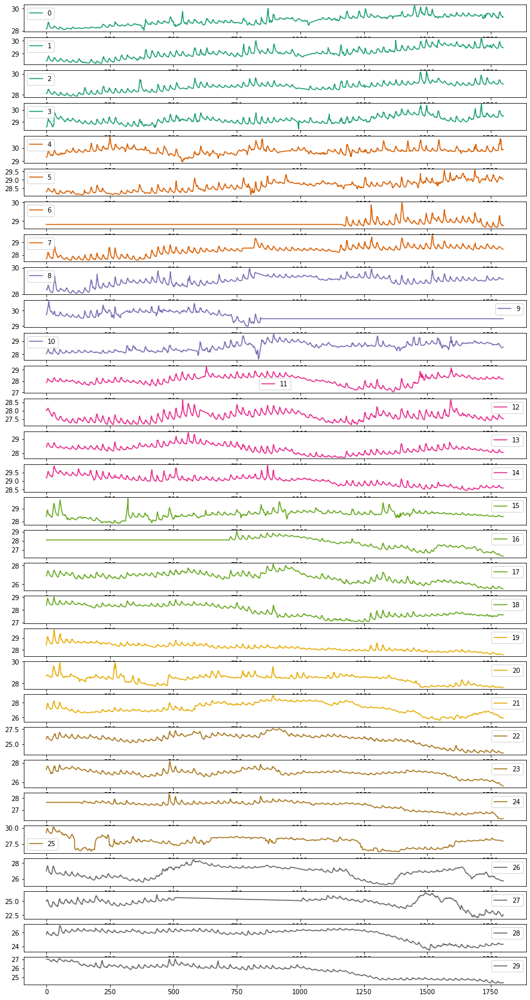

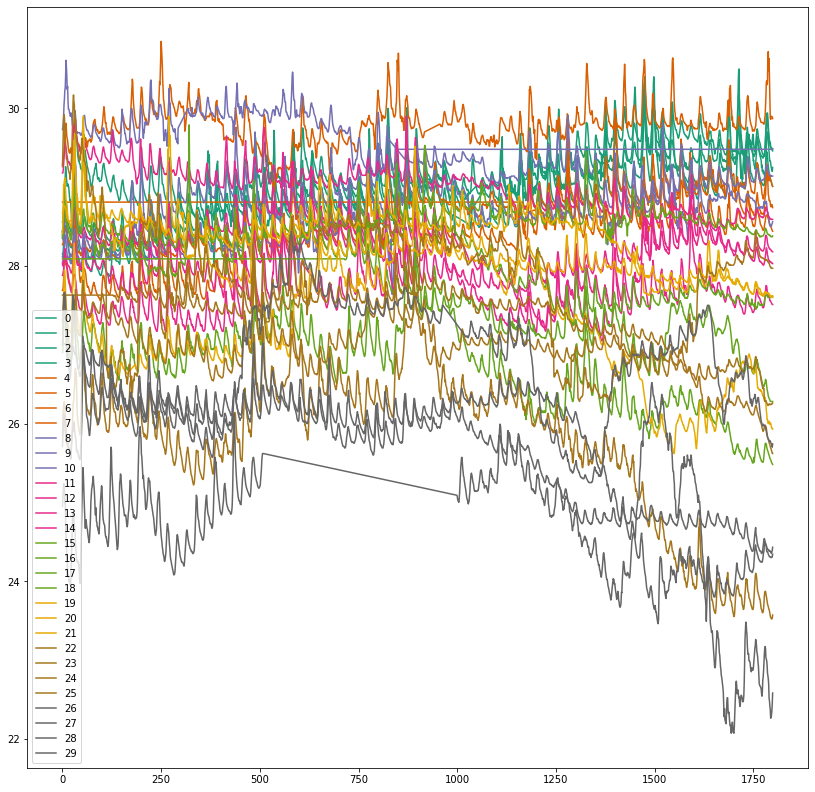

In [10]:
jts.plot_ts(train_df, (14, 28), (14, 14))

In [11]:
jts.mts_adf(train_df)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.5672
 No. Lags Chosen       = 24
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.5. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.3244
 No. Lags Chosen       = 25
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.618. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Sta

### Taking A Lagged Difference

In [12]:
train_diff = train_df.diff().dropna()
jts.mts_adf(train_diff)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -9.7756
 No. Lags Chosen       = 25
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -10.1733
 No. Lags Chosen       = 24
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test 

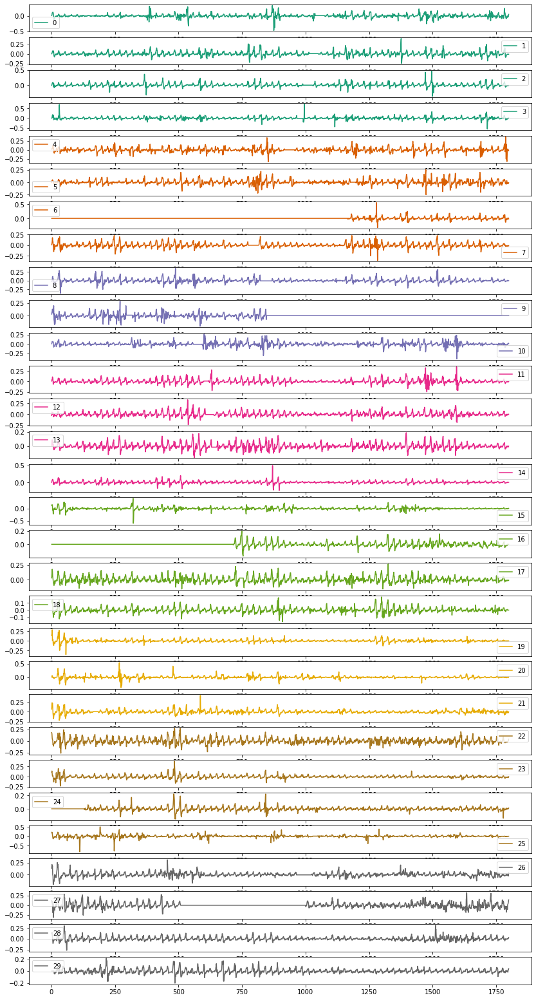

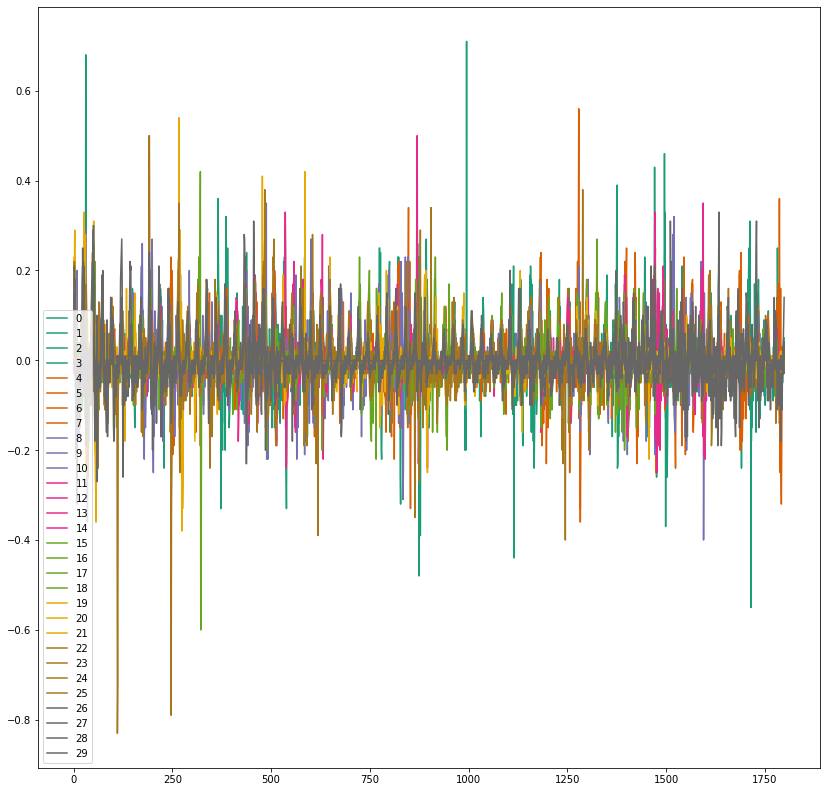

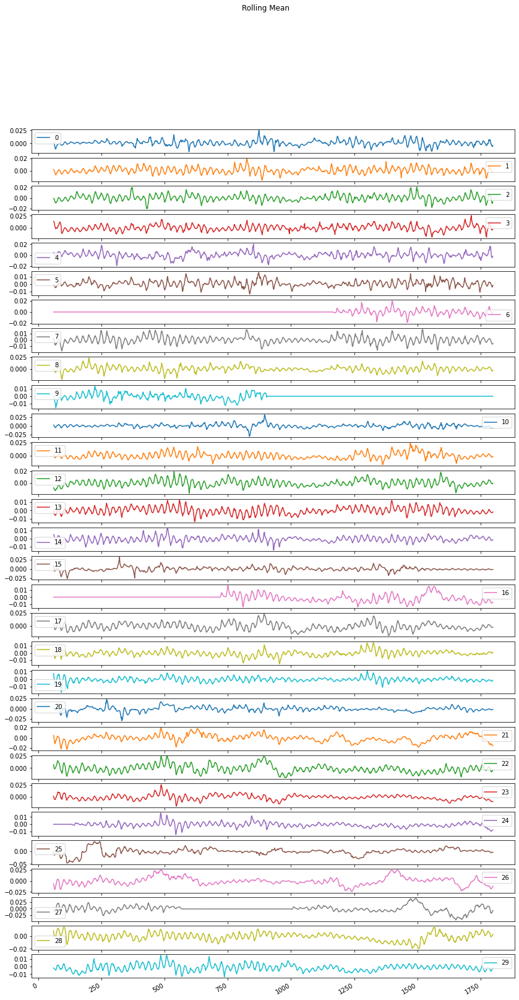

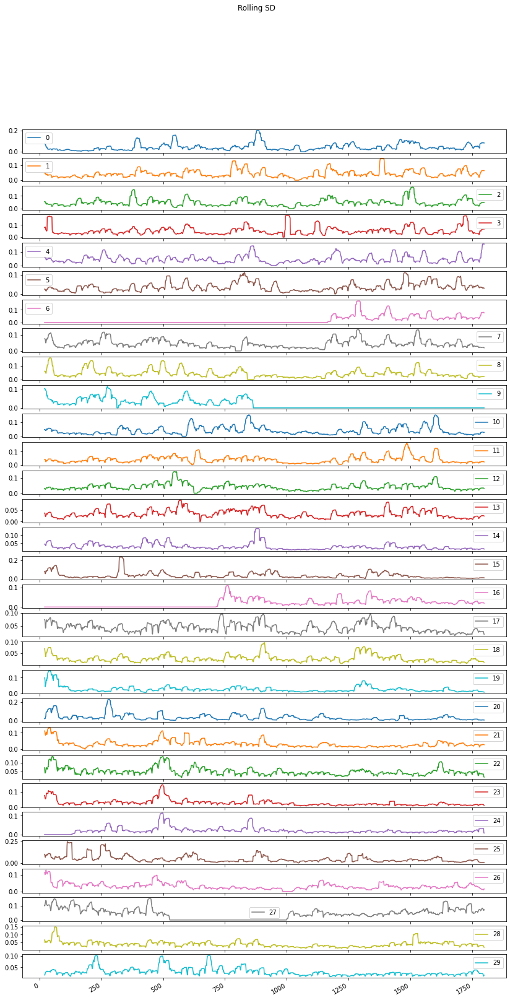

In [13]:
jts.plot_ts(train_diff, (14, 28), (14, 14))
jts.plot_rolling_mean_and_std(train_diff, figsize=(14, 28))

# Order Selection and Modeling

In [14]:
jts.var_order(train_diff)

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'
    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -211.442420    -208.600474    -210.393289     16868.692493  0.000000     
2        -211.603302    -206.008539    -209.537885     1122.150308   0.000001     
3        -211.601786    -203.251699    -208.519100     812.341650    0.983058     
4        -211.604959    -200.497037    -207.504020     791.153476    0.996105     
5        -211.367414    -197.499142    -206.247237     367.261307    1.000000     
6        -211.083487    -194.452346    -204.943084     270.516383    1.000000     
7        -210.763753    -191.367221    -203.602135    

In [15]:
model = VAR(train_diff)
fit = model.fit(1)
fit.summary()

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


   0.046322            1.994           0.046
L1.29        -0.007438         0.056752           -0.131           0.896

Results for equation 26
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const        -0.000011         0.000656           -0.017           0.986
L1.0          0.032804         0.014792            2.218           0.027
L1.1         -0.008767         0.019043           -0.460           0.645
L1.2          0.010043         0.017011            0.590           0.555
L1.3         -0.019498         0.013592           -1.435           0.151
L1.4          0.001693         0.014404            0.118           0.906
L1.5         -0.003562         0.019135           -0.186           0.852
L1.6          0.012870         0.022313            0.577           0.564
L1.7         -0.014043         0.020721           -0.678           0.498
L1.8         -0.017755         0.017979           -0.9

# Model Results for Long Forecasting

In [16]:
test_df.index = test_df.index.astype(str)
test_df.columns = test_df.columns.astype(str)
results_diff_long = jts.forecast(fit, train_diff, test_df, N_test, calc_conf = False)
results_diff_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast,5_forecast,6_forecast,7_forecast,8_forecast,9_forecast,...,20_forecast,21_forecast,22_forecast,23_forecast,24_forecast,25_forecast,26_forecast,27_forecast,28_forecast,29_forecast
0,0.015447,0.000722,-0.002303,-0.002428,-0.001889,-0.004768,-0.002732,0.003914,-0.003746,0.000236,...,0.018744,0.016249,0.045459,0.019083,0.014643,0.022806,0.039866,0.094281,0.040005,0.034089
1,0.008908,0.007267,0.005434,0.003840,0.005796,0.004411,0.002972,0.014757,0.006314,0.003189,...,0.025667,0.026040,0.048086,0.026221,0.016612,0.029365,0.035849,0.066784,0.038788,0.029234
2,0.012844,0.015002,0.014844,0.013929,0.012476,0.012942,0.006079,0.024921,0.017903,0.007371,...,0.026707,0.029068,0.046241,0.027717,0.016229,0.027605,0.029371,0.047671,0.032992,0.023598
3,0.019160,0.022600,0.023920,0.023541,0.018973,0.019235,0.008332,0.032797,0.027298,0.010957,...,0.023626,0.026999,0.040396,0.025574,0.013820,0.022077,0.021814,0.032684,0.025126,0.017038
4,0.024265,0.028401,0.031011,0.030731,0.024221,0.022667,0.009864,0.037157,0.033001,0.013091,...,0.018150,0.021673,0.031753,0.020999,0.010032,0.015191,0.014142,0.020228,0.016625,0.010151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.000553,0.000473,0.000366,0.000374,0.000211,0.000341,-0.000058,0.000289,0.000294,-0.000220,...,-0.000602,-0.000747,-0.001422,-0.001052,-0.000725,-0.000919,-0.000818,-0.001393,-0.000857,-0.001386
196,0.000553,0.000473,0.000366,0.000374,0.000211,0.000341,-0.000058,0.000289,0.000294,-0.000220,...,-0.000602,-0.000747,-0.001422,-0.001052,-0.000725,-0.000919,-0.000818,-0.001393,-0.000857,-0.001386
197,0.000553,0.000473,0.000366,0.000374,0.000211,0.000341,-0.000058,0.000289,0.000294,-0.000220,...,-0.000602,-0.000747,-0.001422,-0.001052,-0.000725,-0.000919,-0.000818,-0.001393,-0.000857,-0.001386
198,0.000553,0.000473,0.000366,0.000374,0.000211,0.000341,-0.000058,0.000289,0.000294,-0.000220,...,-0.000602,-0.000747,-0.001422,-0.001052,-0.000725,-0.000919,-0.000818,-0.001393,-0.000857,-0.001386


In [17]:
results_long = jts.invert_diff_transformation(results_diff_long, train_df)
results_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast,5_forecast,6_forecast,7_forecast,8_forecast,9_forecast,...,20_forecast,21_forecast,22_forecast,23_forecast,24_forecast,25_forecast,26_forecast,27_forecast,28_forecast,29_forecast
0,29.265447,29.460722,29.007697,29.487572,29.868111,29.005232,28.737268,28.443914,29.136254,29.480236,...,27.638744,25.946249,23.615459,25.639083,26.274643,27.992806,25.779866,22.674281,24.380005,24.464089
1,29.274354,29.467990,29.013131,29.491412,29.873907,29.009643,28.740241,28.458671,29.142568,29.483426,...,27.664411,25.972289,23.663545,25.665305,26.291256,28.022171,25.815716,22.741064,24.418793,24.493323
2,29.287199,29.482992,29.027975,29.505341,29.886383,29.022585,28.746320,28.483592,29.160471,29.490796,...,27.691119,26.001358,23.709787,25.693022,26.307484,28.049776,25.845086,22.788735,24.451785,24.516921
3,29.306358,29.505591,29.051895,29.528883,29.905356,29.041820,28.754652,28.516389,29.187769,29.501753,...,27.714745,26.028357,23.750183,25.718596,26.321304,28.071852,25.866901,22.821419,24.476911,24.533960
4,29.330623,29.533993,29.082905,29.559614,29.929577,29.064487,28.764516,28.553546,29.220770,29.514845,...,27.732895,26.050031,23.781936,25.739595,26.331336,28.087043,25.881043,22.841647,24.493536,24.544111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,29.516258,29.729740,29.282283,29.751277,30.069237,29.183884,28.782734,28.705372,29.372281,29.510569,...,27.608432,25.901917,23.508351,25.543671,26.175307,27.898242,25.708547,22.557815,24.311683,24.252594
196,29.516811,29.730213,29.282650,29.751650,30.069448,29.184225,28.782676,28.705661,29.372576,29.510349,...,27.607830,25.901169,23.506930,25.542618,26.174581,27.897323,25.707728,22.556422,24.310826,24.251208
197,29.517364,29.730686,29.283016,29.752024,30.069659,29.184566,28.782617,28.705950,29.372870,29.510129,...,27.607228,25.900422,23.505508,25.541566,26.173856,27.896404,25.706910,22.555030,24.309969,24.249821
198,29.517916,29.731159,29.283382,29.752398,30.069870,29.184908,28.782559,28.706240,29.373164,29.509910,...,27.606626,25.899675,23.504087,25.540514,26.173131,27.895485,25.706091,22.553637,24.309112,24.248435


In [18]:
jts.forecast_accuracy(results_long, test_df)

Results
----------------------------------------------------------------------
           ME            MSE            MAE            MAPE
0       -0.093         0.042          0.133          0.449%        
1       0.044          0.040          0.160          0.540%        
2       -0.124         0.074          0.204          0.690%        
3       -0.092         0.072          0.202          0.673%        
4       -0.145         0.064          0.187          0.616%        
5       -0.051         0.056          0.151          0.514%        
6       -0.150         0.062          0.170          0.583%        
7       -0.180         0.077          0.217          0.748%        
8       0.181          0.072          0.236          0.813%        
9       0.050          0.003          0.050          0.170%        
10      -0.113         0.052          0.156          0.540%        
11      -0.012         0.020          0.106          0.374%        
12      -0.119         0.042          0.151  

<AxesSubplot:>

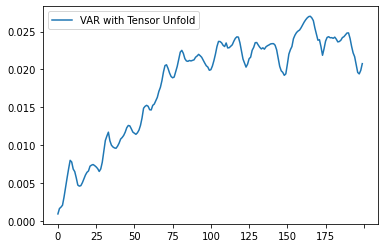

In [19]:
error = jts.calc_mape_per_vector(test_df, results_long)
error = error.rename(columns={"MAPE": "VAR with Tensor Unfold"})
error.plot()

<AxesSubplot:>

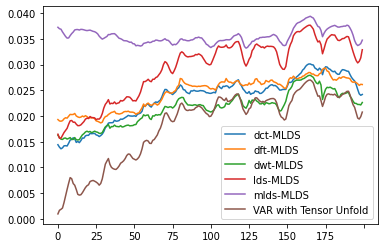

In [20]:
sst_err = sio.loadmat('data/sst_err.mat')
df = pd.DataFrame(np.transpose(sst_err['err_dct']), index=error.index, columns=["dct-MLDS"])
df1 = pd.DataFrame(np.transpose(sst_err['err_dft']), index=error.index, columns=["dft-MLDS"])
df2 = pd.DataFrame(np.transpose(sst_err['err_dwt']), index=error.index, columns=["dwt-MLDS"])
df3 = pd.DataFrame(np.transpose(sst_err['err_lds']), index=error.index, columns=["lds-MLDS"])
df4 = pd.DataFrame(np.transpose(sst_err['err_mlds']), index=error.index, columns=["mlds-MLDS"])
df = pd.concat([df, df1, df2, df3, df4, error], axis=1)
df.plot()